In [1]:
import pandas as pd
from pathlib import Path

SCRIPT_DIR = Path.cwd().parent.parent

df_ki = pd.read_csv(SCRIPT_DIR / "dataset/single-turn/banking77_personas_openai-gpt-oss-120b_clean.csv")
df_ki = pd.read_csv(SCRIPT_DIR / "dataset/single-turn/banking77_personas_phi4:14b_clean.csv")
df_menschlich = pd.read_csv(SCRIPT_DIR / "dataset/single-turn/banking77_test_labels_clean.csv")

print(f"KI-Texte: {len(df_ki)}")
print(f"Menschliche Texte: {len(df_menschlich)}")
df_ki.head()

KI-Texte: 2772
Menschliche Texte: 3080


,id,text,label_text,persona,label
0,8aaf4564-b3e6-47df-806d-4e9a1a3e0599,"Hey there! Seriously, what's going on with my ...",Refund_not_showing_up,angry_layperson,51
1,96f3f987-a79b-43c4-93e6-c2ebe03e8487,"Listen, I’m really ticked off here! I’m sittin...",Refund_not_showing_up,angry_layperson,51
2,0f7ad1c0-4439-4238-8269-aa6b789f30b9,"Listen up, I can't believe you people! I waite...",Refund_not_showing_up,angry_layperson,51
3,2f8d61e2-16db-40b1-9b08-bcc060ee58af,"Hey, listen up! I'm ticked off because money t...",Refund_not_showing_up,angry_layperson,51
4,f938c24d-432a-4aab-a8d8-f9a930c92e16,I can’t believe this! The refund that was supp...,Refund_not_showing_up,angry_layperson,51


In [28]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")

embeddings_ki = model.encode(
    df_ki["text"].tolist(),
    batch_size=128,
    normalize_embeddings=True,
    show_progress_bar=True
)

embeddings_menschlich = model.encode(
    df_menschlich["text"].tolist(),
    batch_size=128,
    normalize_embeddings=True,
    show_progress_bar=True
)

print(embeddings_ki.shape)
print(embeddings_menschlich.shape)

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Batches:   0%|          | 0/22 [00:00<?, ?it/s]

Batches:   0%|          | 0/25 [00:00<?, ?it/s]

(2772, 384)
(3080, 384)


In [29]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

results = []

for label in df_ki["label_text"].unique():
    idx_ki = df_ki["label_text"] == label
    idx_menschlich = df_menschlich["label_text"] == label

    emb_ki_label = embeddings_ki[idx_ki.values]
    emb_menschlich_label = embeddings_menschlich[idx_menschlich.values]

    if len(emb_ki_label) == 0 or len(emb_menschlich_label) == 0:
        continue

    sim_matrix = cosine_similarity(emb_ki_label, emb_menschlich_label)
    avg_sim = np.mean(sim_matrix)

    results.append({
        "label": label,
        "n_ki": len(emb_ki_label),
        "n_menschlich": len(emb_menschlich_label),
        "avg_cosine_similarity": avg_sim
    })

df_results = pd.DataFrame(results).sort_values("avg_cosine_similarity")
df_results

,label,n_ki,n_menschlich,avg_cosine_similarity
51,receiving_money,36,40,0.205021
5,automatic_top_up,36,40,0.256236
25,country_support,36,40,0.260703
59,top_up_failed,36,40,0.316594
71,verify_top_up,36,40,0.324854
...,...,...,...,...
1,activate_my_card,36,40,0.575256
18,card_payment_wrong_exchange_rate,36,40,0.585728
16,card_payment_fee_charged,36,40,0.586189
0,Refund_not_showing_up,36,40,0.589527


In [30]:
overall_avg = df_results["avg_cosine_similarity"].mean()
print(f"Durchschnittliche Ähnlichkeit über alle Labels: {overall_avg:.3f}")

Durchschnittliche Ähnlichkeit über alle Labels: 0.468


In [31]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

def permutation_test_diff(emb_self, emb_cross, n_permutations=1000, seed=42):
    """Testet ob avg(self) - avg(cross) signifikant von 0 verschieden ist."""
    rng = np.random.default_rng(seed)

    self_sims = cosine_similarity(emb_self, emb_self)
    n = self_sims.shape[0]
    mask = ~np.eye(n, dtype=bool)
    observed_self = self_sims[mask].mean()

    observed_cross = cosine_similarity(emb_self, emb_cross).mean()
    observed_diff = observed_self - observed_cross

    combined = np.vstack([emb_self, emb_cross])
    n_self = len(emb_self)

    diffs = []
    for _ in range(n_permutations):
        idx = rng.permutation(len(combined))
        shuffled = combined[idx]
        a, b = shuffled[:n_self], shuffled[n_self:]

        sim_a = cosine_similarity(a, a)
        m = sim_a.shape[0]
        maska = ~np.eye(m, dtype=bool)
        sa = sim_a[maska].mean() if m > 1 else np.nan

        sb = cosine_similarity(a, b).mean()
        diffs.append(sa - sb)

    diffs = np.array(diffs)
    p_value = (np.sum(np.abs(diffs) >= np.abs(observed_diff)) + 1) / (n_permutations + 1)
    return observed_diff, p_value

diff, p = permutation_test_diff(embeddings_ki, embeddings_menschlich)
print(f"Beobachtete Differenz (Self - Cross): {diff:.3f}")
print(f"p-Wert: {p:.4f}")

Beobachtete Differenz (Self - Cross): 0.095
p-Wert: 0.0010


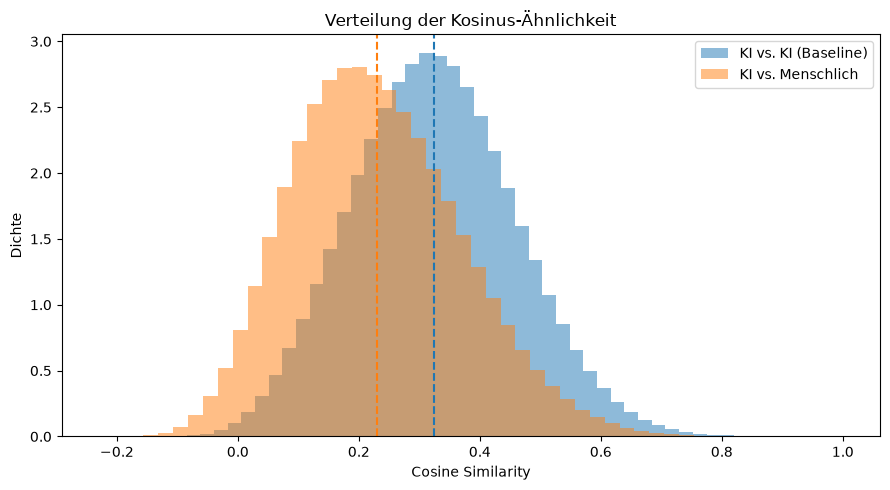

In [32]:
import matplotlib.pyplot as plt

self_sims = cosine_similarity(embeddings_ki, embeddings_ki)
n = self_sims.shape[0]
mask = ~np.eye(n, dtype=bool)
self_sim_values = self_sims[mask]

cross_sim_values = cosine_similarity(embeddings_ki, embeddings_menschlich).flatten()

plt.figure(figsize=(9, 5))
plt.hist(self_sim_values, bins=50, alpha=0.5, label="KI vs. KI (Baseline)", density=True)
plt.hist(cross_sim_values, bins=50, alpha=0.5, label="KI vs. Menschlich", density=True)
plt.axvline(self_sim_values.mean(), color="C0", linestyle="--")
plt.axvline(cross_sim_values.mean(), color="C1", linestyle="--")
plt.title("Verteilung der Kosinus-Ähnlichkeit")
plt.xlabel("Cosine Similarity")
plt.ylabel("Dichte")
plt.legend()
plt.tight_layout()
plt.show()

In [33]:
relative_gap = (self_sim_values.mean() - cross_sim_values.mean()) / self_sim_values.mean()
print(f"Die KI-Texte sind im Schnitt {relative_gap*100:.1f}% weniger ähnlich zu menschlichen Texten als zu sich selbst.")

Die KI-Texte sind im Schnitt 29.2% weniger ähnlich zu menschlichen Texten als zu sich selbst.


In [34]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

self_scores = []
cross_scores = []

for label in sorted(set(df_ki["label_text"]) & set(df_menschlich["label_text"])):
    idx_ki = (df_ki["label_text"] == label).values
    idx_menschlich = (df_menschlich["label_text"] == label).values

    emb_ki_label = embeddings_ki[idx_ki]
    emb_menschlich_label = embeddings_menschlich[idx_menschlich]

    if len(emb_ki_label) < 2 or len(emb_menschlich_label) == 0:
        continue

    # Self-Similarity (KI vs. KI, gleiches Label, ohne Diagonale)
    sim_self = cosine_similarity(emb_ki_label, emb_ki_label)
    n = sim_self.shape[0]
    mask = ~np.eye(n, dtype=bool)
    self_scores.append(sim_self[mask].mean())

    # Cross-Similarity (KI vs. Menschlich, gleiches Label)
    sim_cross = cosine_similarity(emb_ki_label, emb_menschlich_label)
    cross_scores.append(sim_cross.mean())

self_avg = np.mean(self_scores)
cross_avg = np.mean(cross_scores)
relative_gap = (self_avg - cross_avg) / self_avg

print(f"Self-Similarity (gleiches Label): {self_avg:.3f}")
print(f"Cross-Similarity (gleiches Label): {cross_avg:.3f}")
print(f"Relative Lücke: {relative_gap*100:.1f}%")

Self-Similarity (gleiches Label): 0.554
Cross-Similarity (gleiches Label): 0.468
Relative Lücke: 15.5%


Neuer Ansatz aus dem Paper: https://arxiv.org/pdf/2409.00347

In [36]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Standard-Bibliotheken für optionale Fortschrittsanzeige
try:
    from tqdm import tqdm
except ImportError:
    tqdm = lambda x, **kwargs: x

class EmbeddingAnalyser:
    def __init__(self, model_name='all-MiniLM-L6-v2'):
        """
        Initialisiert den Analyser. Versucht, SentenceTransformer zu laden.
        Falls dies fehlschlägt, wird ein Fallback-Modus aktiviert.
        """
        self.model_name = model_name
        self.offline_mode = False
        self.model = None
        self.embedding_dim = 384 # all-MiniLM-L6-v2 hat eine Dimension von 384

        try:
            from sentence_transformers import SentenceTransformer
            print(f"Lade SentenceTransformer Modell '{model_name}'...")
            self.model = SentenceTransformer(model_name)
            print("Modell erfolgreich geladen!")
        except Exception as e:
            self.offline_mode = True
            print("\n[HINWEIS] 'sentence-transformers' konnte nicht geladen werden oder Sie sind offline.")
            print("Das Skript läuft im Fallback-Modus mit simulierten Vektoren.")

    def get_embeddings(self, texts):
        """
        Generiert Embeddings für eine Liste von Texten.
        Im Offline-Modus werden zufällige Vektoren mit Einheitslänge generiert.
        """
        if self.offline_mode or self.model is None:
            # Im Fallback-Modus erzeugen wir zufällige Vektoren
            mock_data = np.random.randn(len(texts), self.embedding_dim)
            norms = np.linalg.norm(mock_data, axis=1, keepdims=True)
            return mock_data / np.maximum(norms, 1e-12)
        else:
            return self.model.encode(texts, show_progress_bar=True, convert_to_numpy=True)

    def calculate_intra_label_diversity(self, embeddings, labels):
        """
        Berechnet die durchschnittliche paarweise Kosinus-Ähnlichkeit innerhalb jedes Labels.
        """
        unique_labels = np.unique(labels)
        diversity_results = {}

        for label in unique_labels:
            idx = [i for i, l in enumerate(labels) if l == label]
            label_embeds = embeddings[idx]

            n_samples = len(label_embeds)
            if n_samples < 2:
                diversity_results[label] = {"mean": 1.0, "std": 0.0}
                continue

            sim_matrix = cosine_similarity(label_embeds)
            triu_indices = np.triu_indices(n_samples, k=1)
            pairwise_similarities = sim_matrix[triu_indices]

            diversity_results[label] = {
                "mean": np.mean(pairwise_similarities),
                "std": np.std(pairwise_similarities)
            }

        return diversity_results

    def calculate_centroids(self, embeddings, labels):
        """
        Berechnet den Zentroiden (Mittelwerts-Vektor) für jedes Label.
        """
        unique_labels = sorted(list(np.unique(labels)))
        centroids = {}

        for label in unique_labels:
            idx = [i for i, l in enumerate(labels) if l == label]
            centroids[label] = np.mean(embeddings[idx], axis=0)

        return centroids

    def align_embeddings(self, X_human, X_synth):
        """
        Führt das Alignment (Standardisierung) durch.
        Verschiebt synthetische Vektoren in den Raum der menschlichen Vektoren.
        """
        # Globaler Mittelwert der menschlichen und synthetischen Vektoren
        u = np.mean(X_human, axis=0)
        s = np.mean(X_synth, axis=0)

        # Verschiebungsvektor d = u - s
        d = u - s

        # Anpassung der synthetischen Vektoren durch Addition des Differenzvektors
        X_synth_aligned = X_synth + d
        return X_synth_aligned, d

    def evaluate_alignment(self, centroids_human, centroids_synth):
        """
        Vergleicht die Kosinus-Ähnlichkeit der Klassen-Zentroiden vor und nach dem Alignment.
        """
        similarities = []
        for label in centroids_human.keys():
            if label in centroids_synth:
                sim = cosine_similarity(
                    centroids_human[label].reshape(1, -1),
                    centroids_synth[label].reshape(1, -1)
                )[0, 0]
                similarities.append(sim)

        if not similarities:
            return 0.0, []
        return np.mean(similarities), similarities


# ==========================================
# EINBINDUNG DEINER EIGENEN DATENSÄTZE
# ==========================================
if __name__ == "__main__":
    print("="*65)
    print("ANALYSATOR FÜR SYNTHETISCHE DATEN MIT EIGENEN DATENSÄTZEN")
    print("="*65)

    # 1. Analysator initialisieren
    analyser = EmbeddingAnalyser(model_name='all-MiniLM-L6-v2')

    # 2. Daten laden (HIER DEINE DATEIPFADE EINTRAGEN)
    # Beispiel für CSV. Falls es Excel ist, nutze pd.read_excel()

    try:
        print("\nLade Datensätze...")
        df_human = df_menschlich.copy()
        df_synth = df_ki.copy()
    except FileNotFoundError:
        print(f"[FEHLER] Dateien nicht gefunden. Bitte passe die Pfade an:")
        exit()

    # 3. Text und Labels als Listen extrahieren
    # Wir stellen sicher, dass fehlende Werte (NaNs) als leere Strings behandelt werden
    texts_human = df_human['text'].fillna("").tolist()
    labels_human = df_human['label'].tolist()

    texts_synth = df_synth['text'].fillna("").tolist()
    labels_synth = df_synth['label'].tolist()

    print(f"-> {len(texts_human)} menschliche Texte geladen.")
    print(f"-> {len(texts_synth)} synthetische Texte geladen.")

    # 4. Embeddings generieren
    print("\n[Schritt 1] Generiere Embeddings (dies kann je nach Datenmenge dauern)...")
    X_human = analyser.get_embeddings(texts_human)
    X_synth = analyser.get_embeddings(texts_synth)

    print(f"-> Dimension der menschlichen Vektoren: {X_human.shape}")
    print(f"-> Dimension der synthetischen Vektoren: {X_synth.shape}")

    # 5. Diversität innerhalb der synthetischen Daten prüfen (Intra-Label)
    print("\n[Schritt 2] Berechne Intra-Label-Diversität der synthetischen Aussagen...")
    synth_diversity = analyser.calculate_intra_label_diversity(X_synth, labels_synth)

    # Berechne den Gesamtdurchschnitt über alle Labels
    avg_synth_sim = np.mean([res["mean"] for res in synth_diversity.values()])
    avg_synth_std = np.mean([res["std"] for res in synth_diversity.values()])
    print(f"-> Durchschnittliche Ähnlichkeit innerhalb der synthetischen Labels: {avg_synth_sim:.4f} (Std: {avg_synth_std:.4f})")

    # 6. Zentroiden berechnen vor Alignment (Nutzt nun separate Labels für Mensch/Synth)
    centroids_human_before = analyser.calculate_centroids(X_human, labels_human)
    centroids_synth_before = analyser.calculate_centroids(X_synth, labels_synth)
    mean_sim_before, _ = analyser.evaluate_alignment(centroids_human_before, centroids_synth_before)

    # 7. Shift-Alignment durchführen
    print("\n[Schritt 3] Führe Standardisierung (Alignment/Shift-Verschiebung) durch...")
    X_synth_aligned, shift_vector = analyser.align_embeddings(X_human, X_synth)

    # 8. Zentroiden berechnen nach Alignment
    centroids_synth_after = analyser.calculate_centroids(X_synth_aligned, labels_synth)
    mean_sim_after, _ = analyser.evaluate_alignment(centroids_human_before, centroids_synth_after)

    print("\n[Schritt 4] Auswertung des Alignments:")
    print(f"-> Kosinus-Ähnlichkeit der Zentroiden VOR Alignment:  {mean_sim_before:.4f}")
    print(f"-> Kosinus-Ähnlichkeit der Zentroiden NACH Alignment: {mean_sim_after:.4f}")
    print("\nErfolgreich durchgeführt!")
    print("="*65)

ANALYSATOR FÜR SYNTHETISCHE DATEN MIT EIGENEN DATENSÄTZEN
Lade SentenceTransformer Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Modell erfolgreich geladen!

Lade Datensätze...
-> 3080 menschliche Texte geladen.
-> 2772 synthetische Texte geladen.

[Schritt 1] Generiere Embeddings (dies kann je nach Datenmenge dauern)...


Batches:   0%|          | 0/97 [00:00<?, ?it/s]

Batches:   0%|          | 0/87 [00:00<?, ?it/s]

-> Dimension der menschlichen Vektoren: (3080, 384)
-> Dimension der synthetischen Vektoren: (2772, 384)

[Schritt 2] Berechne Intra-Label-Diversität der synthetischen Aussagen...
-> Durchschnittliche Ähnlichkeit innerhalb der synthetischen Labels: 0.5540 (Std: 0.1172)

[Schritt 3] Führe Standardisierung (Alignment/Shift-Verschiebung) durch...

[Schritt 4] Auswertung des Alignments:
-> Kosinus-Ähnlichkeit der Zentroiden VOR Alignment:  0.7980
-> Kosinus-Ähnlichkeit der Zentroiden NACH Alignment: 0.8586

Erfolgreich durchgeführt!


UMAP VISUALISIERUNG: MENSCH vs. SYNTHETISCH

Lade DataFrames...

Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Generiere Embeddings für 3080 menschliche Texte...


Batches:   0%|          | 0/97 [00:00<?, ?it/s]

Generiere Embeddings für 2772 synthetische Texte...


Batches:   0%|          | 0/87 [00:00<?, ?it/s]


Führe Alignment (Schwerpunkt-Standardisierung) durch...

Erstelle statischen Vorher/Nachher Plot...

[Matplotlib] Berechne UMAP für 'Vor Alignment' (Das kann einen Moment dauern)...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[Matplotlib] Berechne UMAP für 'Nach Alignment'...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


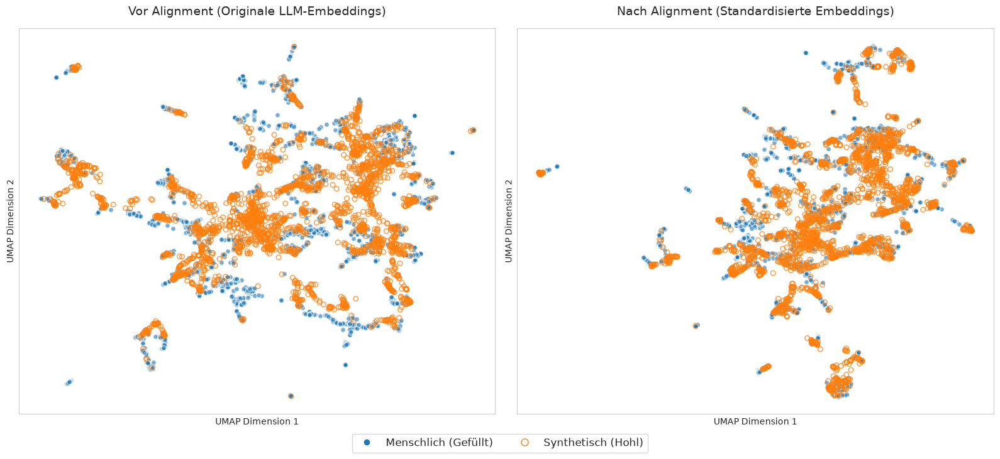


Bereite interaktiven Plot vor...
Öffne interaktiven Plot im Browser...



Fertig! Die Daten inklusive X/Y-Koordinaten wurden als 'daten_mit_umap_koordinaten.csv' gespeichert.


In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
import plotly.express as px

# Imports mit Fehlerbehandlung
try:
    import umap
except ImportError:
    raise ImportError("Das Modul 'umap-learn' fehlt. Bitte mit 'pip install umap-learn' installieren.")

try:
    from sentence_transformers import SentenceTransformer
except ImportError:
    raise ImportError("Das Modul 'sentence-transformers' fehlt. Bitte mit 'pip install sentence-transformers' installieren.")

def align_embeddings(X_human, X_synth):
    """
    Führt die Schwerpunkt-Standardisierung durch (Alignment).
    """
    # 1. Globale Mittelwerte berechnen
    u = np.mean(X_human, axis=0)
    s = np.mean(X_synth, axis=0)

    # 2. Differenzvektor berechnen
    d = u - s

    # 3. Synthetische Daten in den Raum der menschlichen Daten verschieben
    X_synth_aligned = X_synth + d

    return X_synth_aligned, d

def plot_umap_comparison(X_human, X_synth, X_synth_aligned, labels, color_by_source=True):
    """
    Berechnet UMAP für die Vektor-Kombinationen und plottet Vorher/Nachher im Vergleich (Statisch).
    """
    print("\n[Matplotlib] Berechne UMAP für 'Vor Alignment' (Das kann einen Moment dauern)...")
    X_combined_before = np.vstack((X_human, X_synth))
    reducer_before = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_before = reducer_before.fit_transform(X_combined_before)

    print("[Matplotlib] Berechne UMAP für 'Nach Alignment'...")
    X_combined_after = np.vstack((X_human, X_synth_aligned))
    reducer_after = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_after = reducer_after.fit_transform(X_combined_after)

    # Daten wieder auftrennen
    n = len(X_human)
    human_before, synth_before = umap_before[:n], umap_before[n:]
    human_after, synth_after = umap_after[:n], umap_after[n:]

    # --- Visualisierung ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    sns.set_style("whitegrid")

    if color_by_source:
        human_color = '#1f77b4'
        synth_color = '#ff7f0e'

        ax1.scatter(human_before[:, 0], human_before[:, 1], c=human_color, alpha=0.6, marker='o', edgecolors='w', s=30, label='Menschlich')
        ax1.scatter(synth_before[:, 0], synth_before[:, 1], c='none', edgecolors=synth_color, marker='o', s=30, alpha=0.8, label='Synthetisch (LLM)')

        ax2.scatter(human_after[:, 0], human_after[:, 1], c=human_color, alpha=0.6, marker='o', edgecolors='w', s=30)
        ax2.scatter(synth_after[:, 0], synth_after[:, 1], c='none', edgecolors=synth_color, marker='o', s=30, alpha=0.8)

    else:
        palette = sns.color_palette("husl", len(np.unique(labels)))
        colors = [palette[l] for l in labels]

        ax1.scatter(human_before[:, 0], human_before[:, 1], c=colors, alpha=0.5, marker='o', s=30)
        ax1.scatter(synth_before[:, 0], synth_before[:, 1], c=colors, alpha=0.9, marker='x', s=30)

        ax2.scatter(human_after[:, 0], human_after[:, 1], c=colors, alpha=0.5, marker='o', s=30)
        ax2.scatter(synth_after[:, 0], synth_after[:, 1], c=colors, alpha=0.9, marker='x', s=30)

    ax1.set_title("Vor Alignment (Originale LLM-Embeddings)", fontsize=14, pad=15)
    ax2.set_title("Nach Alignment (Standardisierte Embeddings)", fontsize=14, pad=15)

    for ax in [ax1, ax2]:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("UMAP Dimension 1")
        ax.set_ylabel("UMAP Dimension 2")

    if color_by_source:
        legend_elements = [
            mlines.Line2D([0], [0], marker='o', color='w', label='Menschlich (Gefüllt)', markerfacecolor='#1f77b4', markersize=8, markeredgecolor='w'),
            mlines.Line2D([0], [0], marker='o', color='w', label='Synthetisch (Hohl)', markerfacecolor='none', markeredgecolor='#ff7f0e', markersize=8)
        ]
    else:
        legend_elements = [
            mlines.Line2D([0], [0], marker='o', color='w', label='Menschlich (Kreise)', markerfacecolor='gray', markersize=8),
            mlines.Line2D([0], [0], marker='x', color='w', label='Synthetisch (Kreuze)', markeredgecolor='gray', markersize=8)
        ]

    fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, -0.05))

    plt.tight_layout()
    plt.show()

    return umap_after # Wir geben die Koordinaten für den interaktiven Plot zurück


if __name__ == "__main__":
    print("="*65)
    print("UMAP VISUALISIERUNG: MENSCH vs. SYNTHETISCH")
    print("="*65)

    # 1. Daten laden (Pfade ggf. anpassen)
    path_human = "menschliche_daten.csv"
    path_synth = "synthetische_daten.csv"

    try:
        print("\nLade DataFrames...")
        df_human = df_menschlich.copy()
        df_synth = df_ki.copy()
    except FileNotFoundError:
        print(f"[FEHLER] Dateien nicht gefunden. Bitte Pfade anpassen: {path_human} / {path_synth}")
        exit()

    # Wir ersetzen NaN-Werte durch leere Strings, um Fehler beim Embedding zu vermeiden
    texts_human = df_human['text'].fillna("").tolist()
    texts_synth = df_synth['text'].fillna("").tolist()

    # Für die Farbauswahl (falls color_by_source=False gewählt wird)
    labels_human = df_human['label'].tolist()

    # 2. Embeddings generieren
    print("\nLade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    print(f"Generiere Embeddings für {len(texts_human)} menschliche Texte...")
    X_human = model.encode(texts_human, show_progress_bar=True)

    print(f"Generiere Embeddings für {len(texts_synth)} synthetische Texte...")
    X_synth = model.encode(texts_synth, show_progress_bar=True)

    # 3. Alignment durchführen
    print("\nFühre Alignment (Schwerpunkt-Standardisierung) durch...")
    X_synth_aligned, shift_vector = align_embeddings(X_human, X_synth)

    # 4. Statischen Plot erstellen (Vorher vs. Nachher)
    print("\nErstelle statischen Vorher/Nachher Plot...")
    umap_coords_after = plot_umap_comparison(X_human, X_synth, X_synth_aligned, labels_human, color_by_source=True)

    # 5. Interaktiven Plot vorbereiten (Direkt mit deinen DataFrames)
    print("\nBereite interaktiven Plot vor...")

    # Quelle hinzufügen
    df_human['Quelle'] = 'Mensch'
    df_synth['Quelle'] = 'Synthetisch'

    # DataFrames zusammenführen
    df_combined = pd.concat([df_human, df_synth], ignore_index=True)

    # UMAP Koordinaten als neue Spalten anhängen
    df_combined['UMAP_X'] = umap_coords_after[:, 0]
    df_combined['UMAP_Y'] = umap_coords_after[:, 1]

    # 6. Interaktiven Plot im Browser öffnen
    print("Öffne interaktiven Plot im Browser...")
    fig = px.scatter(
        df_combined,
        x='UMAP_X',
        y='UMAP_Y',
        color='Quelle',
        hover_data=['id', 'label', 'label_text', 'text'], # Alle deine Spalten sind hier direkt verfügbar!
        title="Interaktives UMAP nach Alignment",
        opacity=0.7
    )
    fig.show()

    # 7. Daten exportieren
    export_name = "daten_mit_umap_koordinaten.csv"
    df_combined.to_csv(export_name, index=False)
    print(f"\nFertig! Die Daten inklusive X/Y-Koordinaten wurden als '{export_name}' gespeichert.")

UMAP VISUALISIERUNG: MENSCH vs. SYNTHETISCH (Optimiert)

Lade DataFrames...

Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Generiere Embeddings für 3080 menschliche Texte...


Batches:   0%|          | 0/97 [00:00<?, ?it/s]

Generiere Embeddings für 2772 synthetische Texte...


Batches:   0%|          | 0/87 [00:00<?, ?it/s]


Führe Alignment (Schwerpunkt-Standardisierung) durch...

Erstelle statischen Vorher/Nachher Plot...

[Matplotlib] Berechne UMAP für 'Vor Alignment' (Das kann einen Moment dauern)...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[Matplotlib] Berechne UMAP für 'Nach Alignment'...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


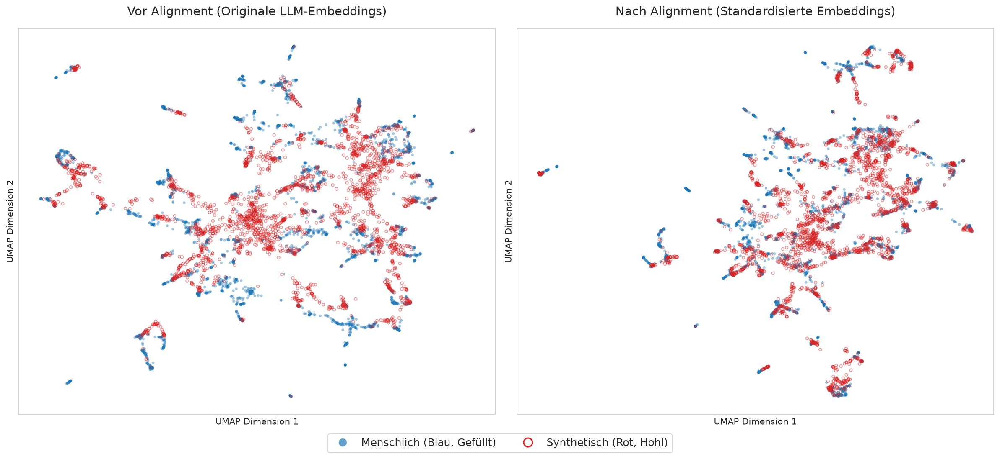


Bereite interaktive Plots vor...



Fertig! Die Daten inklusive Vorher/Nachher-Koordinaten wurden als 'daten_mit_umap_koordinaten.csv' gespeichert.


In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
import plotly.express as px

# Imports mit Fehlerbehandlung
try:
    import umap
except ImportError:
    raise ImportError("Das Modul 'umap-learn' fehlt. Bitte mit 'pip install umap-learn' installieren.")

try:
    from sentence_transformers import SentenceTransformer
except ImportError:
    raise ImportError("Das Modul 'sentence-transformers' fehlt. Bitte mit 'pip install sentence-transformers' installieren.")

def align_embeddings(X_human, X_synth):
    """
    Führt die Schwerpunkt-Standardisierung durch (Alignment).
    """
    u = np.mean(X_human, axis=0)
    s = np.mean(X_synth, axis=0)
    d = u - s
    X_synth_aligned = X_synth + d
    return X_synth_aligned, d

def plot_umap_comparison(X_human, X_synth, X_synth_aligned, labels, color_by_source=True):
    """
    Berechnet UMAP und erstellt eine hochauflösende, transparente Visualisierung.
    """
    print("\n[Matplotlib] Berechne UMAP für 'Vor Alignment' (Das kann einen Moment dauern)...")
    X_combined_before = np.vstack((X_human, X_synth))
    reducer_before = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_before = reducer_before.fit_transform(X_combined_before)

    print("[Matplotlib] Berechne UMAP für 'Nach Alignment'...")
    X_combined_after = np.vstack((X_human, X_synth_aligned))
    reducer_after = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_after = reducer_after.fit_transform(X_combined_after)

    n = len(X_human)
    human_before, synth_before = umap_before[:n], umap_before[n:]
    human_after, synth_after = umap_after[:n], umap_after[n:]

    # --- Visualisierung ---
    # Höhere Auflösung (dpi=150) macht kleine Punkte deutlich besser sichtbar
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7), dpi=150)
    sns.set_style("whitegrid")

    if color_by_source:
        human_color = '#1f77b4' # Blau
        synth_color = '#d62728' # Leuchtendes Rot (besserer Kontrast als Orange)

        # PARAMETER-TUNING GEGEN OVERPLOTTING:
        # s=8 (kleinere Punkte), alpha=0.35 (mehr Transparenz), linewidths=0.5 (dünnere Ränder)
        pt_size = 10
        human_alpha = 0.4
        synth_alpha = 0.5

        # Subplot 1: Vorher
        ax1.scatter(human_before[:, 0], human_before[:, 1], c=human_color, alpha=human_alpha, marker='o', edgecolors='none', s=pt_size)
        ax1.scatter(synth_before[:, 0], synth_before[:, 1], c='none', edgecolors=synth_color, marker='o', s=pt_size, alpha=synth_alpha, linewidths=0.8)

        # Subplot 2: Nachher
        ax2.scatter(human_after[:, 0], human_after[:, 1], c=human_color, alpha=human_alpha, marker='o', edgecolors='none', s=pt_size)
        ax2.scatter(synth_after[:, 0], synth_after[:, 1], c='none', edgecolors=synth_color, marker='o', s=pt_size, alpha=synth_alpha, linewidths=0.8)

    ax1.set_title("Vor Alignment (Originale LLM-Embeddings)", fontsize=14, pad=15)
    ax2.set_title("Nach Alignment (Standardisierte Embeddings)", fontsize=14, pad=15)

    for ax in [ax1, ax2]:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("UMAP Dimension 1")
        ax.set_ylabel("UMAP Dimension 2")

    # Legende anpassen
    if color_by_source:
        legend_elements = [
            mlines.Line2D([0], [0], marker='o', color='w', label='Menschlich (Blau, Gefüllt)', markerfacecolor=human_color, markersize=10, alpha=0.7),
            mlines.Line2D([0], [0], marker='o', color='w', label='Synthetisch (Rot, Hohl)', markerfacecolor='none', markeredgecolor=synth_color, markersize=10, markeredgewidth=1.5)
        ]
        fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, -0.05))

    plt.tight_layout()
    plt.show()

    # Wir geben JETZT BEIDE Koordinaten-Sets zurück!
    return umap_before, umap_after


if __name__ == "__main__":
    print("="*65)
    print("UMAP VISUALISIERUNG: MENSCH vs. SYNTHETISCH (Optimiert)")
    print("="*65)

    try:
        print("\nLade DataFrames...")
        df_human = df_menschlich.copy()
        df_synth = df_ki.copy()
    except NameError:
        print("[FEHLER] df_menschlich oder df_ki nicht gefunden. Bitte lade deine Daten zuerst in diese Variablen.")
        exit()

    texts_human = df_human['text'].fillna("").tolist()
    texts_synth = df_synth['text'].fillna("").tolist()
    labels_human = df_human['label'].tolist()

    print("\nLade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    print(f"Generiere Embeddings für {len(texts_human)} menschliche Texte...")
    X_human = model.encode(texts_human, show_progress_bar=True)

    print(f"Generiere Embeddings für {len(texts_synth)} synthetische Texte...")
    X_synth = model.encode(texts_synth, show_progress_bar=True)

    print("\nFühre Alignment (Schwerpunkt-Standardisierung) durch...")
    X_synth_aligned, shift_vector = align_embeddings(X_human, X_synth)

    print("\nErstelle statischen Vorher/Nachher Plot...")
    # Fängt jetzt beide Rückgabewerte auf
    umap_coords_before, umap_coords_after = plot_umap_comparison(X_human, X_synth, X_synth_aligned, labels_human, color_by_source=True)

    print("\nBereite interaktive Plots vor...")
    df_human['Quelle'] = 'Mensch'
    df_synth['Quelle'] = 'Synthetisch'
    df_combined = pd.concat([df_human, df_synth], ignore_index=True)

    # Speichere Vorher UND Nachher im DataFrame
    df_combined['UMAP_X_Vorher'] = umap_coords_before[:, 0]
    df_combined['UMAP_Y_Vorher'] = umap_coords_before[:, 1]
    df_combined['UMAP_X_Nachher'] = umap_coords_after[:, 0]
    df_combined['UMAP_Y_Nachher'] = umap_coords_after[:, 1]

    # Interaktiver Plot 1: VORHER
    fig_before = px.scatter(
        df_combined, x='UMAP_X_Vorher', y='UMAP_Y_Vorher', color='Quelle',
        hover_data=['id', 'label', 'label_text', 'text'],
        title="Interaktives UMAP: VOR Alignment",
        color_discrete_sequence=['#1f77b4', '#d62728']
    )
    fig_before.update_traces(marker=dict(size=5, opacity=0.6))
    fig_before.show()

    # Interaktiver Plot 2: NACHHER
    fig_after = px.scatter(
        df_combined, x='UMAP_X_Nachher', y='UMAP_Y_Nachher', color='Quelle',
        hover_data=['id', 'label', 'label_text', 'text'],
        title="Interaktives UMAP: NACH Alignment",
        color_discrete_sequence=['#1f77b4', '#d62728']
    )
    fig_after.update_traces(marker=dict(size=5, opacity=0.6))
    fig_after.show()

    export_name = "daten_mit_umap_koordinaten.csv"
    df_combined.to_csv(export_name, index=False)
    print(f"\nFertig! Die Daten inklusive Vorher/Nachher-Koordinaten wurden als '{export_name}' gespeichert.")

FULL PIPELINE: EMBEDDINGS, ALIGNMENT & UMAP-VISUALISIERUNG

Lade DataFrames...

Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Generiere Embeddings für 3080 menschliche Texte...


Batches:   0%|          | 0/97 [00:00<?, ?it/s]

Generiere Embeddings für 2772 synthetische Texte...


Batches:   0%|          | 0/87 [00:00<?, ?it/s]


Führe Alignment (Schwerpunkt-Standardisierung) durch...

Berechne UMAP-Koordinaten (Das kann kurz dauern)...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(



Zeige globalen Vorher/Nachher Plot...


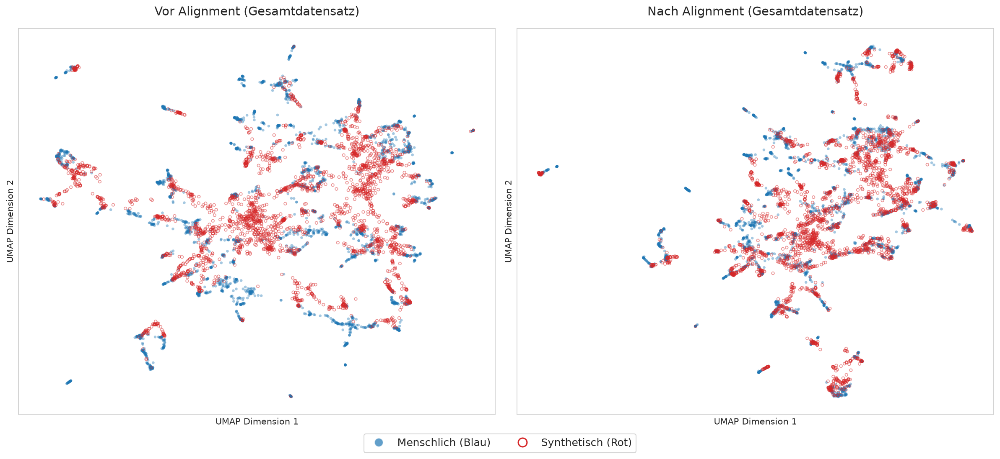


Bereite interaktive Plots und CSV-Export vor...
Öffne interaktive Plots im Browser...



Die Daten inklusive Vorher/Nachher-Koordinaten wurden als 'daten_mit_umap_koordinaten.csv' gespeichert.

Erstelle und speichere 77 Einzel-Plots im Ordner 'umap_pro_label/'...
-> Alle Einzel-Plots wurden erfolgreich exportiert!

PIPELINE ERFOLGREICH BEENDET!


In [45]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
from matplotlib.patches import Ellipse
import plotly.express as px

# Imports mit Fehlerbehandlung
try:
    import umap
except ImportError:
    raise ImportError("Das Modul 'umap-learn' fehlt. Bitte mit 'pip install umap-learn' installieren.")

try:
    from sentence_transformers import SentenceTransformer
except ImportError:
    raise ImportError("Das Modul 'sentence-transformers' fehlt. Bitte mit 'pip install sentence-transformers' installieren.")


def align_embeddings(X_human, X_synth):
    """
    Führt die Schwerpunkt-Standardisierung (Alignment) durch.
    Berechnet die Mittelwerte und verschiebt die synthetischen Daten.
    """
    u = np.mean(X_human, axis=0)
    s = np.mean(X_synth, axis=0)
    d = u - s
    X_synth_aligned = X_synth + d
    return X_synth_aligned, d


def plot_umap_global(umap_before, umap_after, n_human):
    """
    Erstellt den statischen globalen Plot für alle Daten (Optimiert gegen Overplotting).
    """
    human_before, synth_before = umap_before[:n_human], umap_before[n_human:]
    human_after, synth_after = umap_after[:n_human], umap_after[n_human:]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7), dpi=150)
    sns.set_style("whitegrid")

    human_color = '#1f77b4' # Blau
    synth_color = '#d62728' # Rot

    # Parameter gegen Overplotting
    pt_size = 10
    human_alpha = 0.4
    synth_alpha = 0.5

    # Subplot 1: Vorher
    ax1.scatter(human_before[:, 0], human_before[:, 1], c=human_color, alpha=human_alpha, marker='o', edgecolors='none', s=pt_size)
    ax1.scatter(synth_before[:, 0], synth_before[:, 1], c='none', edgecolors=synth_color, marker='o', s=pt_size, alpha=synth_alpha, linewidths=0.8)

    # Subplot 2: Nachher
    ax2.scatter(human_after[:, 0], human_after[:, 1], c=human_color, alpha=human_alpha, marker='o', edgecolors='none', s=pt_size)
    ax2.scatter(synth_after[:, 0], synth_after[:, 1], c='none', edgecolors=synth_color, marker='o', s=pt_size, alpha=synth_alpha, linewidths=0.8)

    ax1.set_title("Vor Alignment (Gesamtdatensatz)", fontsize=14, pad=15)
    ax2.set_title("Nach Alignment (Gesamtdatensatz)", fontsize=14, pad=15)

    for ax in [ax1, ax2]:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("UMAP Dimension 1")
        ax.set_ylabel("UMAP Dimension 2")

    # Legende
    legend_elements = [
        mlines.Line2D([0], [0], marker='o', color='w', label='Menschlich (Blau)', markerfacecolor=human_color, markersize=10, alpha=0.7),
        mlines.Line2D([0], [0], marker='o', color='w', label='Synthetisch (Rot)', markerfacecolor='none', markeredgecolor=synth_color, markersize=10, markeredgewidth=1.5)
    ]
    fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, -0.05))

    plt.tight_layout()
    plt.show()


def save_umap_per_label(df_combined, output_dir="umap_pro_label"):
    """
    Erstellt für jedes Label einen eigenen Vorher/Nachher-Scatterplot
    und speichert diese als PNG-Dateien in einem Ordner.
    Nutzt 'label_text' für aussagekräftige Titel und Dateinamen.
    """
    os.makedirs(output_dir, exist_ok=True)

    # Wir iterieren jetzt über label_text! dropna() verhindert Fehler durch leere Felder.
    unique_labels = df_combined['label_text'].dropna().unique()

    print(f"\nErstelle und speichere {len(unique_labels)} Einzel-Plots im Ordner '{output_dir}/'...")

    # Farben definieren
    palette = {'Mensch': '#1f77b4', 'Synthetisch': '#d62728'}

    for lbl in unique_labels:
        # Daten filtern basierend auf label_text
        df_lbl = df_combined[df_combined['label_text'] == lbl]

        # Falls ein Label aus irgendeinem Grund leer ist, überspringen
        if df_lbl.empty: continue

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=120)
        sns.set_style("whitegrid")

        # Plot 1: Vorher
        sns.scatterplot(
            data=df_lbl, x='UMAP_X_Vorher', y='UMAP_Y_Vorher',
            hue='Quelle', palette=palette, alpha=0.7, ax=ax1, s=60, edgecolor='w'
        )
        ax1.set_title(f"Thema: {lbl}\nVOR Alignment", fontsize=12)

        # Plot 2: Nachher
        sns.scatterplot(
            data=df_lbl, x='UMAP_X_Nachher', y='UMAP_Y_Nachher',
            hue='Quelle', palette=palette, alpha=0.7, ax=ax2, s=60, edgecolor='w'
        )
        ax2.set_title(f"Thema: {lbl}\nNACH Alignment", fontsize=12)

        # Achsen für das jeweilige Label identisch skalieren, um Verschiebung zu zeigen
        x_min = min(df_lbl['UMAP_X_Vorher'].min(), df_lbl['UMAP_X_Nachher'].min()) - 1.5
        x_max = max(df_lbl['UMAP_X_Vorher'].max(), df_lbl['UMAP_X_Nachher'].max()) + 1.5
        y_min = min(df_lbl['UMAP_Y_Vorher'].min(), df_lbl['UMAP_Y_Nachher'].min()) - 1.5
        y_max = max(df_lbl['UMAP_Y_Vorher'].max(), df_lbl['UMAP_Y_Nachher'].max()) + 1.5

        for ax in [ax1, ax2]:
            ax.set_xlim(x_min, x_max)
            ax.set_ylim(y_min, y_max)
            ax.set_xlabel("UMAP Dimension 1")
            ax.set_ylabel("UMAP Dimension 2")
            ax.legend(loc='best', fontsize=9)

        plt.tight_layout()

        # Sicheren Dateinamen aus dem label_text erstellen
        safe_name = str(lbl).replace("/", "_").replace("\\", "_").replace(" ", "_").replace(":", "_").replace("?", "")
        plt.savefig(os.path.join(output_dir, f"{safe_name}.png"))
        plt.close(fig) # Schließt die Figur im Hintergrund, um RAM freizugeben

    print("-> Alle Einzel-Plots wurden erfolgreich exportiert!")


if __name__ == "__main__":
    print("="*65)
    print("FULL PIPELINE: EMBEDDINGS, ALIGNMENT & UMAP-VISUALISIERUNG")
    print("="*65)

    # 1. Daten laden (Aus deinen bestehenden Variablen oder Dateien)
    try:
        print("\nLade DataFrames...")
        # Erwartet, dass df_menschlich und df_ki im Notebook bereits existieren
        df_human = df_menschlich.copy()
        df_synth = df_ki.copy()
    except NameError:
        print("[HINWEIS] Variablen 'df_menschlich' nicht gefunden. Lade aus CSV-Dateien (Beispiel)...")
        # Fallback: Lade aus Dateien, falls Variablen nicht im RAM sind
        df_human = pd.read_csv("menschliche_daten.csv")
        df_synth = pd.read_csv("synthetische_daten.csv")

    texts_human = df_human['text'].fillna("").tolist()
    texts_synth = df_synth['text'].fillna("").tolist()
    n_human = len(texts_human)

    # 2. Embeddings generieren
    print("\nLade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    print(f"Generiere Embeddings für {len(texts_human)} menschliche Texte...")
    X_human = model.encode(texts_human, show_progress_bar=True)

    print(f"Generiere Embeddings für {len(texts_synth)} synthetische Texte...")
    X_synth = model.encode(texts_synth, show_progress_bar=True)

    # 3. Alignment durchführen
    print("\nFühre Alignment (Schwerpunkt-Standardisierung) durch...")
    X_synth_aligned, shift_vector = align_embeddings(X_human, X_synth)

    # 4. UMAP Berechnungen
    print("\nBerechne UMAP-Koordinaten (Das kann kurz dauern)...")
    reducer_before = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_before = reducer_before.fit_transform(np.vstack((X_human, X_synth)))

    reducer_after = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    umap_after = reducer_after.fit_transform(np.vstack((X_human, X_synth_aligned)))

    # 5. Globalen Matplotlib Plot anzeigen (Vorher/Nachher alle Daten)
    print("\nZeige globalen Vorher/Nachher Plot...")
    plot_umap_global(umap_before, umap_after, n_human)

    # 6. DataFrame für interaktive Plots und Export zusammenbauen
    print("\nBereite interaktive Plots und CSV-Export vor...")
    df_human['Quelle'] = 'Mensch'
    df_synth['Quelle'] = 'Synthetisch'
    df_combined = pd.concat([df_human, df_synth], ignore_index=True)

    # Beide Koordinatenpaare speichern
    df_combined['UMAP_X_Vorher'] = umap_before[:, 0]
    df_combined['UMAP_Y_Vorher'] = umap_before[:, 1]
    df_combined['UMAP_X_Nachher'] = umap_after[:, 0]
    df_combined['UMAP_Y_Nachher'] = umap_after[:, 1]

    # 7. Interaktive Browser-Plots mit Plotly
    print("Öffne interaktive Plots im Browser...")

    fig_before = px.scatter(
        df_combined, x='UMAP_X_Vorher', y='UMAP_Y_Vorher', color='Quelle',
        hover_data=['id', 'label', 'label_text', 'text'],
        title="Interaktives UMAP: VOR Alignment",
        color_discrete_sequence=['#1f77b4', '#d62728']
    )
    fig_before.update_traces(marker=dict(size=5, opacity=0.6))
    fig_before.show()

    fig_after = px.scatter(
        df_combined, x='UMAP_X_Nachher', y='UMAP_Y_Nachher', color='Quelle',
        hover_data=['id', 'label', 'label_text', 'text'],
        title="Interaktives UMAP: NACH Alignment",
        color_discrete_sequence=['#1f77b4', '#d62728']
    )
    fig_after.update_traces(marker=dict(size=5, opacity=0.6))
    fig_after.show()

    # 8. CSV Datenexport
    export_name = "daten_mit_umap_koordinaten.csv"
    df_combined.to_csv(export_name, index=False)
    print(f"\nDie Daten inklusive Vorher/Nachher-Koordinaten wurden als '{export_name}' gespeichert.")

    # 9. Automatische Einzel-Plots pro Label exportieren
    save_umap_per_label(df_combined, output_dir="umap_pro_label")

    print("\n" + "="*65)
    print("PIPELINE ERFOLGREICH BEENDET!")
    print("="*65)

Starte Benchmark...
Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]


Berechne Baseline (Menschliche Daten)...
Evaluiere Modell A (z.B. GPT-5.4-Nano)...
Evaluiere Modell B (z.B. GPT-OSS)...
Evaluiere Modell C (z.B. Phi4)...

--- LEADERBOARD ---
| Modell                       |   Themen_Trefferquote |   Diversitäts_Score |
|:-----------------------------|----------------------:|--------------------:|
| Modell A (z.B. GPT-5.4-Nano) |              0.934743 |            0.888002 |
| Modell B (z.B. GPT-OSS)      |              0.960344 |            0.917717 |
| Modell C (z.B. Phi4)         |              0.876449 |            0.796764 |


/tmp/ipykernel_14727/3828996304.py:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_results, x='Modell', y='Themen_Trefferquote', ax=ax1, palette=colors)
/tmp/ipykernel_14727/3828996304.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_results, x='Modell', y='Diversitäts_Score', ax=ax2, palette=colors)


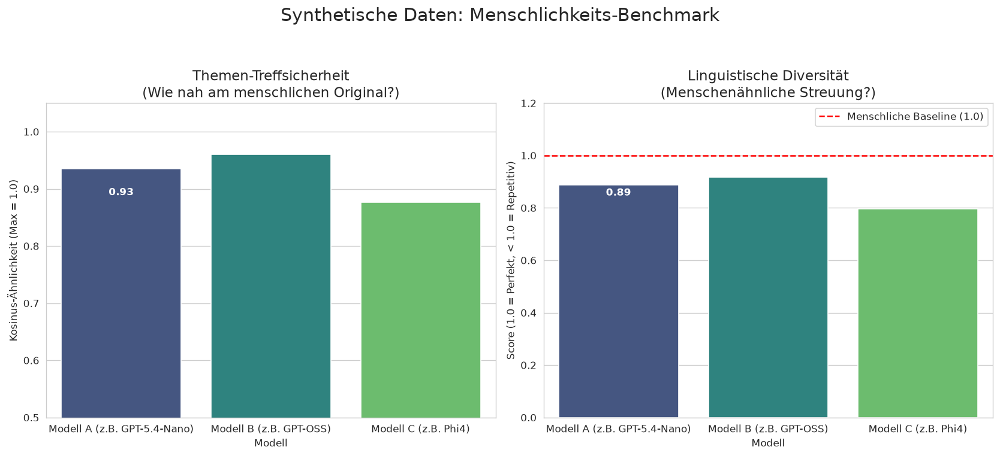

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def calculate_centroid_and_diversity(embeddings):
    """Berechnet den Mittelpunkt (Centroid) und die durchschnittliche Streuung (Diversität)."""
    centroid = np.mean(embeddings, axis=0)

    # Diversität = Durchschnittliche Distanz aller Punkte zu ihrem eigenen Zentrum
    # (Wir nutzen 1 - Cosine Similarity zum Zentrum als Distanzmaß)
    similarities_to_center = cosine_similarity(embeddings, centroid.reshape(1, -1))
    diversity = 1.0 - np.mean(similarities_to_center)

    return centroid, diversity

def evaluate_models(df_human, dict_of_synth_dfs, text_col='text'):
    """
    Vergleicht mehrere synthetische Datensätze mit einer menschlichen Baseline.
    """
    print("Lade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    print("\nBerechne Baseline (Menschliche Daten)...")
    human_texts = df_human[text_col].fillna("").tolist()
    human_embeds = model.encode(human_texts, show_progress_bar=False)

    human_centroid, human_diversity = calculate_centroid_and_diversity(human_embeds)

    results = []

    for model_name, df_synth in dict_of_synth_dfs.items():
        print(f"Evaluiere {model_name}...")
        synth_texts = df_synth[text_col].fillna("").tolist()
        synth_embeds = model.encode(synth_texts, show_progress_bar=False)

        synth_centroid, synth_diversity = calculate_centroid_and_diversity(synth_embeds)

        # 1. Metrik: Wie nah am menschlichen Thema? (0 bis 1, höher ist besser)
        accuracy = cosine_similarity(human_centroid.reshape(1, -1), synth_centroid.reshape(1, -1))[0][0]

        # 2. Metrik: Wie menschenähnlich ist die Wortschatz-Varianz?
        # (1.0 = exakt so divers wie Menschen, < 1.0 = repetitiver Roboter)
        diversity_ratio = synth_diversity / human_diversity if human_diversity > 0 else 0

        results.append({
            'Modell': model_name,
            'Themen_Trefferquote': accuracy,
            'Diversitäts_Score': diversity_ratio
        })

    df_results = pd.DataFrame(results)
    return df_results, human_diversity

def plot_benchmark_dashboard(df_results):
    """
    Erstellt ein einfaches, vergleichbares Balkendiagramm-Dashboard.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=120)
    sns.set_style("whitegrid")

    colors = sns.color_palette("viridis", len(df_results))

    # Plot 1: Accuracy
    sns.barplot(data=df_results, x='Modell', y='Themen_Trefferquote', ax=ax1, palette=colors)
    ax1.set_title("Themen-Treffsicherheit\n(Wie nah am menschlichen Original?)", fontsize=14)
    ax1.set_ylim(0.5, 1.05) # Zoom auf den relevanten Bereich
    ax1.set_ylabel("Kosinus-Ähnlichkeit (Max = 1.0)")

    # Plot 2: Diversity
    sns.barplot(data=df_results, x='Modell', y='Diversitäts_Score', ax=ax2, palette=colors)
    ax2.set_title("Linguistische Diversität\n(Menschenähnliche Streuung?)", fontsize=14)
    ax2.axhline(1.0, color='red', linestyle='--', label='Menschliche Baseline (1.0)')
    ax2.set_ylim(0, 1.2)
    ax2.set_ylabel("Score (1.0 = Perfekt, < 1.0 = Repetitiv)")
    ax2.legend()

    for ax in [ax1, ax2]:
        for i, v in enumerate(ax.containers[0]):
            ax.text(v.get_x() + v.get_width()/2., v.get_height() - 0.05,
                    f"{v.get_height():.2f}", ha='center', va='bottom', color='white', fontweight='bold')

    plt.suptitle("Synthetische Daten: Menschlichkeits-Benchmark", fontsize=18, y=1.05)
    plt.tight_layout()
    plt.show()

# ==========================================
# AUSFÜHRUNG MIT DEINEN DATEN
# ==========================================
if __name__ == "__main__":

    # ANPASSUNG: Lade hier deine echten DataFrames!
    df_human = pd.read_csv(Path(dataset_dir / "banking77_test_labels_clean.csv"))
    df_model_A = pd.read_csv(Path(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv"))
    df_model_B = pd.read_csv(Path(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv"))
    df_model_C = pd.read_csv(Path(dataset_dir / "banking77_personas_phi4:14b_clean.csv"))

    # Packe deine 3 Modelle in ein Dictionary (Namen kannst du frei wählen)
    synth_datasets = {
        "Modell A (z.B. GPT-5.4-Nano)": df_model_A,
        "Modell B (z.B. GPT-OSS)": df_model_B,
        "Modell C (z.B. Phi4)": df_model_C
    }

    print("Starte Benchmark...")
    df_leaderboard, _ = evaluate_models(df_human, synth_datasets)

    print("\n--- LEADERBOARD ---")
    print(df_leaderboard.to_markdown(index=False))

    plot_benchmark_dashboard(df_leaderboard)

Starte Benchmark (Pro-Label Berechnung)...
Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]


Berechne Baseline (Menschliche Daten pro Label)...
Evaluiere Modell A
(GPT-5.4-Nano)...
Evaluiere Modell B
(GPT-OSS-120b)...
Evaluiere Modell C
(Phi4:14b)...

--- LEADERBOARD (Intra-Label Metriken) ---
| Modell         |   Themen_Trefferquote |   Diversitäts_Score |
|:---------------|----------------------:|--------------------:|
| Modell A       |              0.891734 |            0.857086 |
| (GPT-5.4-Nano) |                       |                     |
| Modell B       |              0.913851 |            1.10655  |
| (GPT-OSS-120b) |                       |                     |
| Modell C       |              0.798004 |            1.10818  |
| (Phi4:14b)     |                       |                     |


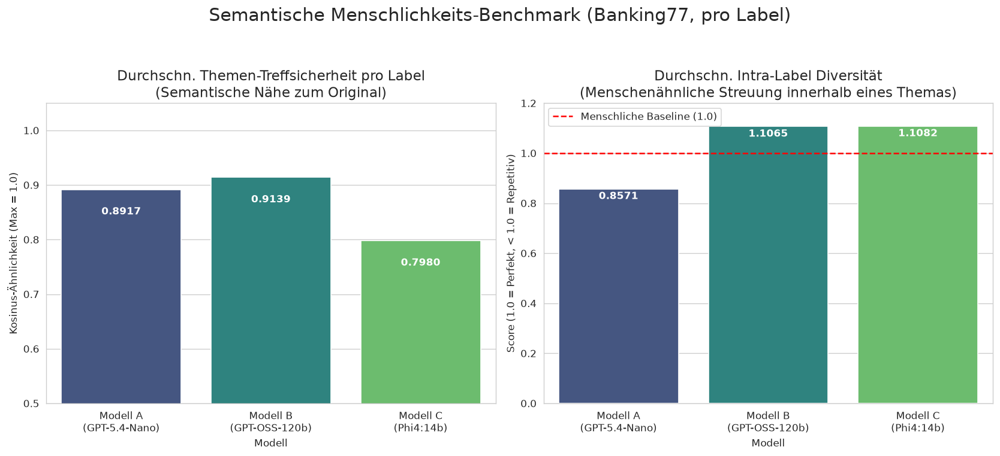

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from pathlib import Path

dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def get_metrics_per_label(df, model, text_col='text', label_col='label'):
    """
    Berechnet den Vektor-Schwerpunkt und die Diversität für JEDES LABEL einzeln.
    """
    texts = df[text_col].fillna("").tolist()
    labels = df[label_col].tolist()

    # Alles auf einmal encodieren (viel schneller)
    embeddings = model.encode(texts, show_progress_bar=False)

    label_metrics = {}
    unique_labels = np.unique(labels)

    for lbl in unique_labels:
        # Finde alle Sätze, die zu diesem spezifischen Label gehören
        idx = [i for i, l in enumerate(labels) if l == lbl]
        if len(idx) == 0: continue

        label_embeds = embeddings[idx]

        # Schwerpunkt DIESES Labels
        centroid = np.mean(label_embeds, axis=0)

        # Diversität DIESES Labels (Streuung um den eigenen Schwerpunkt)
        if len(idx) > 1:
            sim_to_center = cosine_similarity(label_embeds, centroid.reshape(1, -1))
            diversity = 1.0 - np.mean(sim_to_center)
        else:
            diversity = 0.0

        label_metrics[lbl] = {
            'centroid': centroid,
            'diversity': diversity
        }

    return label_metrics

def evaluate_models_per_label(df_human, dict_of_synth_dfs, text_col='text', label_col='label'):
    """
    Vergleicht die synthetischen Daten pro Label mit der menschlichen Baseline.
    """
    print("Lade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    print("\nBerechne Baseline (Menschliche Daten pro Label)...")
    human_metrics = get_metrics_per_label(df_human, model, text_col, label_col)

    results = []

    for model_name, df_synth in dict_of_synth_dfs.items():
        print(f"Evaluiere {model_name}...")
        synth_metrics = get_metrics_per_label(df_synth, model, text_col, label_col)

        label_accuracies = []
        label_diversities_synth = []
        label_diversities_human = []

        # Wir vergleichen jedes Label exakt mit seinem menschlichen Gegenstück
        for lbl, h_data in human_metrics.items():
            if lbl in synth_metrics:
                s_data = synth_metrics[lbl]

                # 1. Semantische Nähe DIESES Labels (Trefferquote)
                sim = cosine_similarity(h_data['centroid'].reshape(1, -1), s_data['centroid'].reshape(1, -1))[0][0]
                label_accuracies.append(sim)

                # 2. Diversitäten sammeln
                label_diversities_human.append(h_data['diversity'])
                label_diversities_synth.append(s_data['diversity'])

        # Durchschnitt über alle 77 Labels bilden
        mean_accuracy = np.mean(label_accuracies)
        mean_human_div = np.mean(label_diversities_human)
        mean_synth_div = np.mean(label_diversities_synth)

        # Score: 1.0 = exakt so divers wie Menschen
        diversity_ratio = mean_synth_div / mean_human_div if mean_human_div > 0 else 0

        results.append({
            'Modell': model_name,
            'Themen_Trefferquote': mean_accuracy,
            'Diversitäts_Score': diversity_ratio
        })

    return pd.DataFrame(results)

def plot_benchmark_dashboard(df_results):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), dpi=120)
    sns.set_style("whitegrid")

    colors = sns.color_palette("viridis", len(df_results))

    sns.barplot(data=df_results, x='Modell', y='Themen_Trefferquote', hue='Modell', ax=ax1, palette=colors, legend=False)
    ax1.set_title("Durchschn. Themen-Treffsicherheit pro Label\n(Semantische Nähe zum Original)", fontsize=14)
    ax1.set_ylim(0.5, 1.05)
    ax1.set_ylabel("Kosinus-Ähnlichkeit (Max = 1.0)")

    sns.barplot(data=df_results, x='Modell', y='Diversitäts_Score', hue='Modell', ax=ax2, palette=colors, legend=False)
    ax2.set_title("Durchschn. Intra-Label Diversität\n(Menschenähnliche Streuung innerhalb eines Themas)", fontsize=14)
    ax2.axhline(1.0, color='red', linestyle='--', label='Menschliche Baseline (1.0)')
    ax2.set_ylim(0, 1.2)
    ax2.set_ylabel("Score (1.0 = Perfekt, < 1.0 = Repetitiv)")
    ax2.legend()

    for ax in [ax1, ax2]:
        for p in ax.patches:
            if p.get_height() > 0:
                ax.text(p.get_x() + p.get_width()/2., p.get_height() - 0.05,
                        f"{p.get_height():.4f}", ha='center', va='bottom', color='white', fontweight='bold')

    plt.suptitle("Semantische Menschlichkeits-Benchmark (Banking77, pro Label)", fontsize=18, y=1.05)
    plt.tight_layout()
    plt.show()

# ==========================================
# AUSFÜHRUNG MIT DEINEN DATEN
# ==========================================
if __name__ == "__main__":

    try:
        df_human = pd.read_csv(dataset_dir / "banking77_test_labels_clean.csv")
        df_model_A = pd.read_csv(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv")
        df_model_B = pd.read_csv(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv")
        df_model_C = pd.read_csv(dataset_dir / "banking77_personas_phi4:14b_clean.csv")
    except FileNotFoundError as e:
        print(f"[FEHLER] Datei nicht gefunden: {e}")
        exit()

    synth_datasets = {
        "Modell A\n(GPT-5.4-Nano)": df_model_A,
        "Modell B\n(GPT-OSS-120b)": df_model_B,
        "Modell C\n(Phi4:14b)": df_model_C
    }

    print("Starte Benchmark (Pro-Label Berechnung)...")
    # WICHTIG: Er übermittelt hier 'label_text', damit exakt nach den 77 Intent-Namen gruppiert wird
    df_leaderboard = evaluate_models_per_label(df_human, synth_datasets, text_col='text', label_col='label_text')

    print("\n--- LEADERBOARD (Intra-Label Metriken) ---")
    try:
        print(df_leaderboard.to_markdown(index=False))
    except ImportError:
        print(df_leaderboard.to_string(index=False))

    plot_benchmark_dashboard(df_leaderboard)

Lade Datensätze...
Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Generiere Embeddings (Das kann einen Moment dauern)...
Führe Dimensionsreduktion (UMAP) durch...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Erstelle hochauflösenden 2x2 Plot für die Thesis...


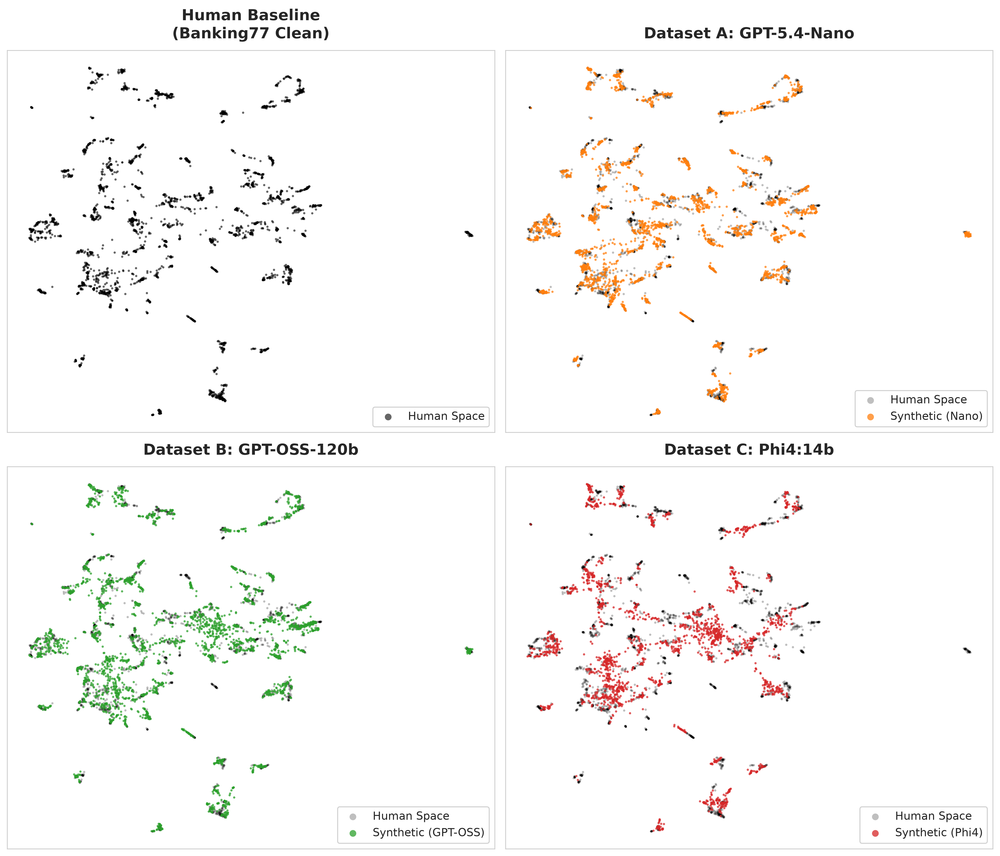


Erfolgreich gespeichert als:
- umap_model_comparison_2x2.png
- umap_model_comparison_2x2.pdf


In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from pathlib import Path

try:
    import umap
except ImportError:
    raise ImportError("Das Modul 'umap-learn' fehlt. Bitte mit 'pip install umap-learn' installieren.")

# Pfad zu deinen Daten
dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def create_thesis_umap_grid_2x2(df_human, df_A, df_B, df_C, text_col='text'):
    print("Lade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    # 1. Texte extrahieren
    texts_human = df_human[text_col].fillna("").tolist()
    texts_A = df_A[text_col].fillna("").tolist()
    texts_B = df_B[text_col].fillna("").tolist()
    texts_C = df_C[text_col].fillna("").tolist()

    # 2. Embeddings generieren
    print("Generiere Embeddings (Das kann einen Moment dauern)...")
    emb_human = model.encode(texts_human, show_progress_bar=False)
    emb_A = model.encode(texts_A, show_progress_bar=False)
    emb_B = model.encode(texts_B, show_progress_bar=False)
    emb_C = model.encode(texts_C, show_progress_bar=False)

    # 3. UMAP auf ALLEN Daten fitten (damit der 2D-Raum identisch ist)
    print("Führe Dimensionsreduktion (UMAP) durch...")
    all_embeddings = np.vstack([emb_human, emb_A, emb_B, emb_C])

    reducer = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    all_umap = reducer.fit_transform(all_embeddings)

    # 4. UMAP-Koordinaten wieder aufteilen
    n = len(texts_human)
    umap_h = all_umap[0:n]
    umap_A = all_umap[n:2*n]
    umap_B = all_umap[2*n:3*n]
    umap_C = all_umap[3*n:4*n]

    # ==========================================
    # VISUALISIERUNG (2x2 Grid für das Paper)
    # ==========================================
    print("Erstelle hochauflösenden 2x2 Plot für die Thesis...")

    # 2x2 Layout, figsize angepasst für quadratischere Boxen
    fig, axes = plt.subplots(2, 2, figsize=(14, 12), dpi=300)
    axes = axes.flatten() # Macht die Indexierung (axes[0] bis axes[3]) einfacher
    sns.set_style("white")

    # Plot Parameter
    pt_size = 5
    alpha_bg = 0.25 # Schwarzer Schatten im Hintergrund
    alpha_fg = 0.75 # Kräftigere Synthetik-Farben im Vordergrund

    color_human = '#000000'  # Klares Schwarz für Human Space
    color_A = '#ff7f0e'      # Orange (Nano)
    color_B = '#2ca02c'      # Grün (GPT-OSS)
    color_C = '#d62728'      # Rot (Phi4)

    # --- Ax 0: Human Baseline ---
    axes[0].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=0.6, edgecolors='none', label="Human Space")
    axes[0].set_title("Human Baseline\n(Banking77 Clean)", fontsize=15, fontweight='bold', pad=12)
    axes[0].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 1: Model A (Nano) ---
    axes[1].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none', label="Human Space")
    axes[1].scatter(umap_A[:, 0], umap_A[:, 1], c=color_A, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (Nano)")
    axes[1].set_title("Dataset A: GPT-5.4-Nano", fontsize=15, fontweight='bold', pad=12)
    axes[1].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 2: Model B (GPT-OSS) ---
    axes[2].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none', label="Human Space")
    axes[2].scatter(umap_B[:, 0], umap_B[:, 1], c=color_B, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (GPT-OSS)")
    axes[2].set_title("Dataset B: GPT-OSS-120b", fontsize=15, fontweight='bold', pad=12)
    axes[2].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 3: Model C (Phi4) ---
    axes[3].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none', label="Human Space")
    axes[3].scatter(umap_C[:, 0], umap_C[:, 1], c=color_C, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (Phi4)")
    axes[3].set_title("Dataset C: Phi4:14b", fontsize=15, fontweight='bold', pad=12)
    axes[3].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # Globale Formatierung für alle Achsen
    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])
        # Rahmen dezent in hellgrau, damit er nicht ablenkt
        for spine in ax.spines.values():
            spine.set_color('#cccccc')

    plt.tight_layout()

    # Export-Namen angepasst
    output_png = "umap_model_comparison_2x2.png"
    output_pdf = "umap_model_comparison_2x2.pdf"
    plt.savefig(output_png, bbox_inches='tight')
    plt.savefig(output_pdf, bbox_inches='tight')

    plt.show()
    print(f"\nErfolgreich gespeichert als:\n- {output_png}\n- {output_pdf}")

# ==========================================
# AUSFÜHRUNG MIT DEINEN DATEN
# ==========================================
if __name__ == "__main__":
    try:
        print("Lade Datensätze...")
        df_human = pd.read_csv(dataset_dir / "banking77_test_labels_clean.csv")
        df_model_A = pd.read_csv(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv")
        df_model_B = pd.read_csv(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv")
        df_model_C = pd.read_csv(dataset_dir / "banking77_personas_phi4:14b_clean.csv")

        create_thesis_umap_grid_2x2(df_human, df_model_A, df_model_B, df_model_C, text_col='text')
    except FileNotFoundError as e:
        print(f"[FEHLER] Datei nicht gefunden: {e}")

Filtere Daten nach Labels, die 'card' enthalten...
Gefunden: 26 verschiedene Labels mit insgesamt 1040 Punkten pro Modell.
Generiere Embeddings für den Nachbarschafts-Zoom...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Führe Dimensionsreduktion durch...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


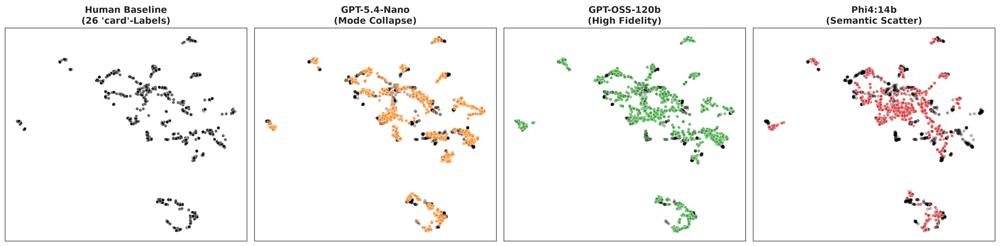

Plot erfolgreich gespeichert als: umap_neighborhood_card.pdf


In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from pathlib import Path
import umap

dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def create_neighborhood_umap_grid(df_human, df_A, df_B, df_C, keyword='card', text_col='text', label_col='label_text'):
    print(f"Filtere Daten nach Labels, die '{keyword}' enthalten...")

    # Filtere alle DataFrames (case=False ignoriert Groß-/Kleinschreibung)
    df_h_sub = df_human[df_human[label_col].str.contains(keyword, case=False, na=False)]
    df_A_sub = df_A[df_A[label_col].str.contains(keyword, case=False, na=False)]
    df_B_sub = df_B[df_B[label_col].str.contains(keyword, case=False, na=False)]
    df_C_sub = df_C[df_C[label_col].str.contains(keyword, case=False, na=False)]

    # Wie viele Labels und Punkte haben wir gefunden?
    unique_labels = df_h_sub[label_col].nunique()
    total_points = len(df_h_sub)
    print(f"Gefunden: {unique_labels} verschiedene Labels mit insgesamt {total_points} Punkten pro Modell.")

    # Texte extrahieren
    texts_h = df_h_sub[text_col].fillna("").tolist()
    texts_A = df_A_sub[text_col].fillna("").tolist()
    texts_B = df_B_sub[text_col].fillna("").tolist()
    texts_C = df_C_sub[text_col].fillna("").tolist()

    print("Generiere Embeddings für den Nachbarschafts-Zoom...")
    model = SentenceTransformer('all-MiniLM-L6-v2')
    emb_h = model.encode(texts_h, show_progress_bar=False)
    emb_A = model.encode(texts_A, show_progress_bar=False)
    emb_B = model.encode(texts_B, show_progress_bar=False)
    emb_C = model.encode(texts_C, show_progress_bar=False)

    # UMAP fitten (n_neighbors leicht erhöhen, um Cluster-Strukturen besser zu erkennen)
    print("Führe Dimensionsreduktion durch...")
    all_embeddings = np.vstack([emb_h, emb_A, emb_B, emb_C])

    reducer = umap.UMAP(n_components=2, random_state=42, metric='cosine', n_neighbors=15)
    all_umap = reducer.fit_transform(all_embeddings)

    # Aufteilen
    n = len(texts_h)
    umap_h = all_umap[0:n]
    umap_A = all_umap[n:2*n]
    umap_B = all_umap[2*n:3*n]
    umap_C = all_umap[3*n:4*n]

    # ==========================================
    # VISUALISIERUNG (1x4 Grid)
    # ==========================================
    fig, axes = plt.subplots(1, 4, figsize=(20, 5), dpi=300)
    sns.set_style("whitegrid")

    pt_size = 20 # Punktgröße angepasst für eine mittlere Menge an Punkten
    alpha_bg = 0.3
    alpha_fg = 0.7

    color_human = '#000000'
    color_A = '#ff7f0e'
    color_B = '#2ca02c'
    color_C = '#d62728'

    # Einheitliche Achsen
    x_min, x_max = all_umap[:, 0].min() - 1, all_umap[:, 0].max() + 1
    y_min, y_max = all_umap[:, 1].min() - 1, all_umap[:, 1].max() + 1

    # --- Ax 0: Human ---
    axes[0].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=0.6, edgecolors='w', linewidths=0.5)
    axes[0].set_title(f"Human Baseline\n({unique_labels} '{keyword}'-Labels)", fontsize=13, fontweight='bold')

    # --- Ax 1: Nano ---
    axes[1].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[1].scatter(umap_A[:, 0], umap_A[:, 1], c=color_A, s=pt_size, alpha=alpha_fg, edgecolors='w', linewidths=0.5)
    axes[1].set_title("GPT-5.4-Nano\n(Mode Collapse)", fontsize=13, fontweight='bold')

    # --- Ax 2: GPT-OSS ---
    axes[2].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[2].scatter(umap_B[:, 0], umap_B[:, 1], c=color_B, s=pt_size, alpha=alpha_fg, edgecolors='w', linewidths=0.5)
    axes[2].set_title("GPT-OSS-120b\n(High Fidelity)", fontsize=13, fontweight='bold')

    # --- Ax 3: Phi4 ---
    axes[3].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[3].scatter(umap_C[:, 0], umap_C[:, 1], c=color_C, s=pt_size, alpha=alpha_fg, edgecolors='w', linewidths=0.5)
    axes[3].set_title("Phi4:14b\n(Semantic Scatter)", fontsize=13, fontweight='bold')

    for ax in axes:
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks([])
        ax.set_yticks([])

    plt.tight_layout()
    output_pdf = f"umap_neighborhood_{keyword}.pdf"
    plt.savefig(output_pdf, bbox_inches='tight')
    plt.show()
    print(f"Plot erfolgreich gespeichert als: {output_pdf}")

if __name__ == "__main__":
    df_human = pd.read_csv(dataset_dir / "banking77_test_labels_clean.csv")
    df_model_A = pd.read_csv(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv")
    df_model_B = pd.read_csv(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv")
    df_model_C = pd.read_csv(dataset_dir / "banking77_personas_phi4:14b_clean.csv")

    # Hier übergibst du das Keyword 'card'
    create_neighborhood_umap_grid(df_human, df_model_A, df_model_B, df_model_C, keyword='card')

Suche nach 10 semantisch weit entfernten Labels...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Ausgewählte Labels: ['card_linking', 'transfer_into_account', 'exchange_rate', 'why_verify_identity', 'edit_personal_details', 'top_up_reverted', 'balance_not_updated_after_cheque_or_cash_deposit', 'lost_or_stolen_phone', 'receiving_money', 'automatic_top_up']

Generiere Embeddings für 400 Punkte pro Modell...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Führe Dimensionsreduktion (UMAP) durch...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Erstelle hochauflösenden 2x2 Plot für die Thesis...


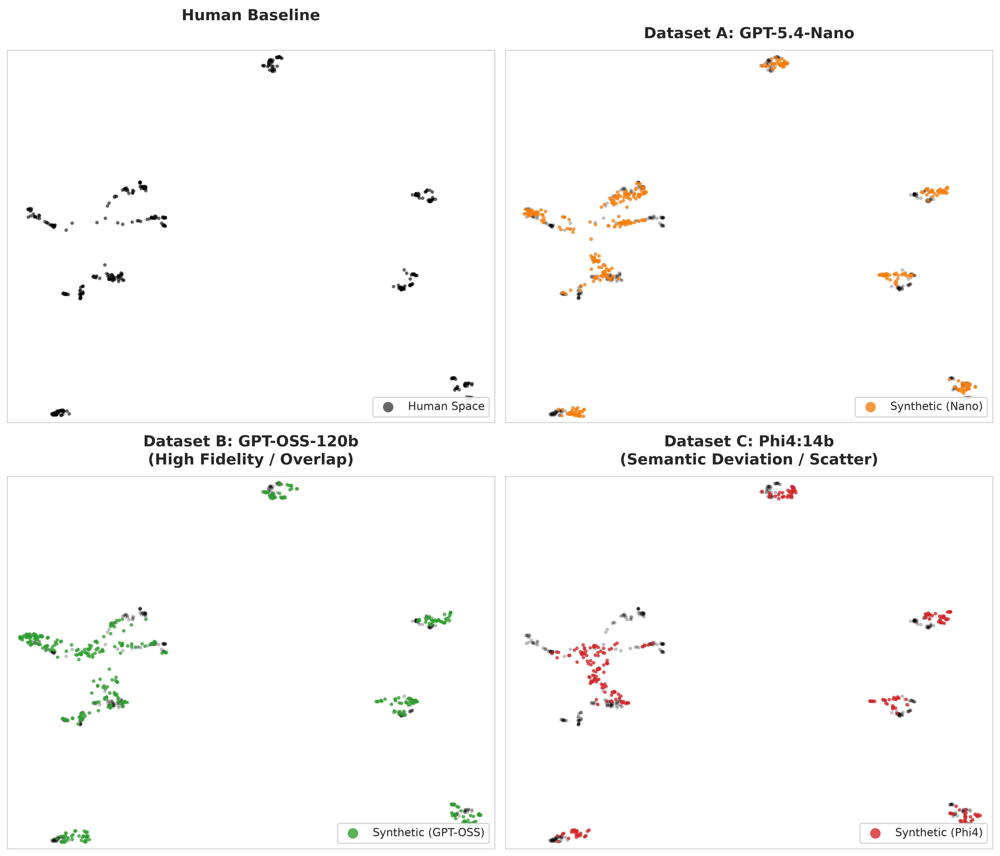


Erfolgreich gespeichert als:
- umap_10_diverse_labels_2x2.png
- umap_10_diverse_labels_2x2.pdf


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from pathlib import Path
import random

try:
    import umap
except ImportError:
    raise ImportError("Das Modul 'umap-learn' fehlt. Bitte mit 'pip install umap-learn' installieren.")

# Pfad zu deinen Daten
dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def select_diverse_labels(df, text_col='text', label_col='label_text', n_labels=10):
    """
    Wählt n_labels aus, die im Vektorraum maximal voneinander entfernt sind.
    """
    print(f"Suche nach {n_labels} semantisch weit entfernten Labels...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    # Nimm einfach den ersten Satz jedes Labels als Repräsentanten (schneller)
    first_texts = df.groupby(label_col)[text_col].first().reset_index()
    embeddings = model.encode(first_texts[text_col].tolist(), show_progress_bar=False)

    # Berechne die Ähnlichkeit aller Labels zueinander
    sim_matrix = cosine_similarity(embeddings)

    # Greedy-Algorithmus: Wähle Start-Label zufällig
    random.seed(42)
    selected_indices = [random.randint(0, len(embeddings) - 1)]

    # Wähle die restlichen 9 Labels so, dass sie maximal weit weg von den bisherigen sind
    for _ in range(n_labels - 1):
        # Ähnlichkeit zu den bereits gewählten Labels
        sim_to_selected = sim_matrix[:, selected_indices]
        # Maximalste Ähnlichkeit zu IRGENDEINEM bereits gewählten Label
        max_sim = np.max(sim_to_selected, axis=1)
        # Wir wollen das Label, wo diese maximale Ähnlichkeit am KLEINSTEN ist (weiteste Entfernung)
        best_idx = np.argmin(max_sim)
        selected_indices.append(best_idx)

    diverse_labels = first_texts[label_col].iloc[selected_indices].tolist()
    print("Ausgewählte Labels:", diverse_labels)
    return diverse_labels

def create_diverse_10_umap_grid_2x2(df_human, df_A, df_B, df_C, text_col='text', label_col='label_text'):
    # 1. Die 10 diversen Labels identifizieren
    target_labels = select_diverse_labels(df_human, text_col, label_col, n_labels=10)

    # 2. Alle DataFrames auf diese 10 Labels filtern
    df_h_sub = df_human[df_human[label_col].isin(target_labels)]
    df_A_sub = df_A[df_A[label_col].isin(target_labels)]
    df_B_sub = df_B[df_B[label_col].isin(target_labels)]
    df_C_sub = df_C[df_C[label_col].isin(target_labels)]

    # Texte extrahieren
    texts_h = df_h_sub[text_col].fillna("").tolist()
    texts_A = df_A_sub[text_col].fillna("").tolist()
    texts_B = df_B_sub[text_col].fillna("").tolist()
    texts_C = df_C_sub[text_col].fillna("").tolist()

    # 3. Embeddings generieren
    print(f"\nGeneriere Embeddings für {len(texts_h)} Punkte pro Modell...")
    model = SentenceTransformer('all-MiniLM-L6-v2')
    emb_h = model.encode(texts_h, show_progress_bar=False)
    emb_A = model.encode(texts_A, show_progress_bar=False)
    emb_B = model.encode(texts_B, show_progress_bar=False)
    emb_C = model.encode(texts_C, show_progress_bar=False)

    # 4. UMAP auf ALLEN gefilterten Daten fitten
    print("Führe Dimensionsreduktion (UMAP) durch...")
    all_embeddings = np.vstack([emb_h, emb_A, emb_B, emb_C])

    # n_neighbors leicht erhöht für schönere Cluster-Bildung bei weniger Daten
    reducer = umap.UMAP(n_components=2, random_state=42, metric='cosine', n_neighbors=25)
    all_umap = reducer.fit_transform(all_embeddings)

    # Koordinaten wieder aufteilen
    n = len(texts_h)
    umap_h = all_umap[0:n]
    umap_A = all_umap[n:2*n]
    umap_B = all_umap[2*n:3*n]
    umap_C = all_umap[3*n:4*n]

    # ==========================================
    # VISUALISIERUNG (2x2 Grid)
    # ==========================================
    print("Erstelle hochauflösenden 2x2 Plot für die Thesis...")

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), dpi=300)
    axes = axes.flatten()
    sns.set_style("white")

    # Plot Parameter
    pt_size = 12
    alpha_bg = 0.25 # Schwarzer Schatten im Hintergrund
    alpha_fg = 0.8  # Kräftigere Synthetik-Farben im Vordergrund

    color_human = '#000000'
    color_A = '#ff7f0e'
    color_B = '#2ca02c'
    color_C = '#d62728'

    # Achsen-Limits synchronisieren
    x_min, x_max = all_umap[:, 0].min() - 0.5, all_umap[:, 0].max() + 0.5
    y_min, y_max = all_umap[:, 1].min() - 0.5, all_umap[:, 1].max() + 0.5

    # --- Ax 0: Human Baseline ---
    axes[0].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=0.6, edgecolors='none', label="Human Space")
    axes[0].set_title(f"Human Baseline\n", fontsize=15, fontweight='bold', pad=12)
    axes[0].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 1: Model A (Nano) ---
    axes[1].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[1].scatter(umap_A[:, 0], umap_A[:, 1], c=color_A, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (Nano)")
    axes[1].set_title("Dataset A: GPT-5.4-Nano", fontsize=15, fontweight='bold', pad=12)
    axes[1].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 2: Model B (GPT-OSS) ---
    axes[2].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[2].scatter(umap_B[:, 0], umap_B[:, 1], c=color_B, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (GPT-OSS)")
    axes[2].set_title("Dataset B: GPT-OSS-120b\n(High Fidelity / Overlap)", fontsize=15, fontweight='bold', pad=12)
    axes[2].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # --- Ax 3: Model C (Phi4) ---
    axes[3].scatter(umap_h[:, 0], umap_h[:, 1], c=color_human, s=pt_size, alpha=alpha_bg, edgecolors='none')
    axes[3].scatter(umap_C[:, 0], umap_C[:, 1], c=color_C, s=pt_size, alpha=alpha_fg, edgecolors='none', label="Synthetic (Phi4)")
    axes[3].set_title("Dataset C: Phi4:14b\n(Semantic Deviation / Scatter)", fontsize=15, fontweight='bold', pad=12)
    axes[3].legend(loc='lower right', fontsize=11, markerscale=3, frameon=True).get_frame().set_alpha(0.9)

    # Formatierung anwenden
    for ax in axes:
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_color('#cccccc')

    plt.tight_layout()
    output_png = "umap_10_diverse_labels_2x2.png"
    output_pdf = "umap_10_diverse_labels_2x2.pdf"
    plt.savefig(output_png, bbox_inches='tight')
    plt.savefig(output_pdf, bbox_inches='tight')

    plt.show()
    print(f"\nErfolgreich gespeichert als:\n- {output_png}\n- {output_pdf}")

if __name__ == "__main__":
    try:
        df_human = pd.read_csv(dataset_dir / "banking77_test_labels_clean.csv")
        df_model_A = pd.read_csv(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv")
        df_model_B = pd.read_csv(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv")
        df_model_C = pd.read_csv(dataset_dir / "banking77_personas_phi4:14b_clean.csv")

        create_diverse_10_umap_grid_2x2(df_human, df_model_A, df_model_B, df_model_C)
    except FileNotFoundError as e:
        print(f"[FEHLER] Datei nicht gefunden: {e}")

Lade KI-Modell 'all-MiniLM-L6-v2'...


Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

Generiere Embeddings für alle Daten (Das dauert kurz)...
Führe globale Dimensionsreduktion durch...


/home/leon/Arbeit/Projekte/Forschung/Test/banking77-evaluation/.venv/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Erstelle Zoom-In Plot für das Label 'age_limit'...


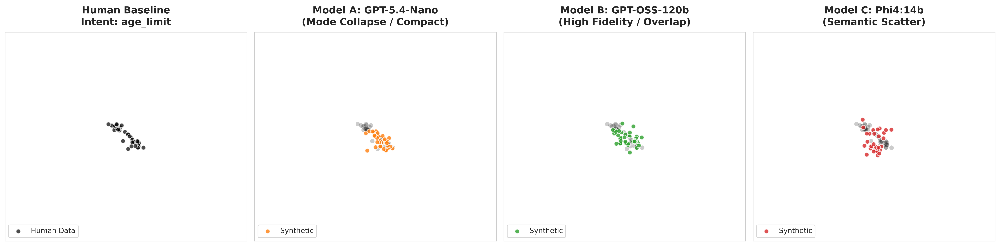


Plot erfolgreich exportiert als: umap_zoom_intent_age_limit.pdf


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
from pathlib import Path
import umap

dataset_dir = Path.cwd().parent.parent / "dataset" / "single-turn"

def create_global_umap_with_local_zoom(df_human, df_A, df_B, df_C, target_intent='age_limit', text_col='text', label_col='label_text'):
    print("Lade KI-Modell 'all-MiniLM-L6-v2'...")
    model = SentenceTransformer('all-MiniLM-L6-v2')

    # 1. Texte extrahieren
    texts_h = df_human[text_col].fillna("").tolist()
    texts_A = df_A[text_col].fillna("").tolist()
    texts_B = df_B[text_col].fillna("").tolist()
    texts_C = df_C[text_col].fillna("").tolist()

    print("Generiere Embeddings für alle Daten (Das dauert kurz)...")
    emb_h = model.encode(texts_h, show_progress_bar=False)
    emb_A = model.encode(texts_A, show_progress_bar=False)
    emb_B = model.encode(texts_B, show_progress_bar=False)
    emb_C = model.encode(texts_C, show_progress_bar=False)

    # 2. UMAP auf ALLEN Daten fitten
    print("Führe globale Dimensionsreduktion durch...")
    all_embeddings = np.vstack([emb_h, emb_A, emb_B, emb_C])

    reducer = umap.UMAP(n_components=2, random_state=42, metric='cosine')
    all_umap = reducer.fit_transform(all_embeddings)

    # 3. UMAP-Koordinaten KORREKT wieder aufteilen (basiert auf tatsächlicher Länge!)
    len_h = len(texts_h)
    len_A = len(texts_A)
    len_B = len(texts_B)
    len_C = len(texts_C)

    umap_h = all_umap[0 : len_h]
    umap_A = all_umap[len_h : len_h + len_A]
    umap_B = all_umap[len_h + len_A : len_h + len_A + len_B]
    umap_C = all_umap[len_h + len_A + len_B : len_h + len_A + len_B + len_C]

    # 4. Masken für das Ziel-Label erstellen
    mask_h = (df_human[label_col] == target_intent).values
    mask_A = (df_A[label_col] == target_intent).values
    mask_B = (df_B[label_col] == target_intent).values
    mask_C = (df_C[label_col] == target_intent).values

    # 5. Bounding Box (Kamera-Zoom) berechnen (basierend auf der menschlichen Baseline)
    margin = 1.0
    x_min = umap_h[mask_h, 0].min() - margin
    x_max = umap_h[mask_h, 0].max() + margin
    y_min = umap_h[mask_h, 1].min() - margin
    y_max = umap_h[mask_h, 1].max() + margin

    # ==========================================
    # VISUALISIERUNG (1x4 Zoom Grid)
    # ==========================================
    print(f"Erstelle Zoom-In Plot für das Label '{target_intent}'...")
    fig, axes = plt.subplots(1, 4, figsize=(20, 5), dpi=300)
    sns.set_style("white")

    pt_size = 40

    color_human = '#000000'
    color_A = '#ff7f0e'
    color_B = '#2ca02c'
    color_C = '#d62728'

    # --- Ax 0: Human Baseline ---
    axes[0].scatter(umap_h[mask_h, 0], umap_h[mask_h, 1], c=color_human, s=pt_size, alpha=0.7, edgecolors='w', label="Human Data")
    axes[0].set_title(f"Human Baseline\nIntent: {target_intent}", fontsize=14, fontweight='bold', pad=10)

    # --- Ax 1: Model A (Nano) ---
    axes[1].scatter(umap_h[mask_h, 0], umap_h[mask_h, 1], c=color_human, s=pt_size, alpha=0.2, edgecolors='none')
    axes[1].scatter(umap_A[mask_A, 0], umap_A[mask_A, 1], c=color_A, s=pt_size, alpha=0.8, edgecolors='w', label="Synthetic")
    axes[1].set_title("Model A: GPT-5.4-Nano\n(Mode Collapse / Compact)", fontsize=14, fontweight='bold', pad=10)

    # --- Ax 2: Model B (GPT-OSS) ---
    axes[2].scatter(umap_h[mask_h, 0], umap_h[mask_h, 1], c=color_human, s=pt_size, alpha=0.2, edgecolors='none')
    axes[2].scatter(umap_B[mask_B, 0], umap_B[mask_B, 1], c=color_B, s=pt_size, alpha=0.8, edgecolors='w', label="Synthetic")
    axes[2].set_title("Model B: GPT-OSS-120b\n(High Fidelity / Overlap)", fontsize=14, fontweight='bold', pad=10)

    # --- Ax 3: Model C (Phi4) ---
    axes[3].scatter(umap_h[mask_h, 0], umap_h[mask_h, 1], c=color_human, s=pt_size, alpha=0.2, edgecolors='none')
    axes[3].scatter(umap_C[mask_C, 0], umap_C[mask_C, 1], c=color_C, s=pt_size, alpha=0.8, edgecolors='w', label="Synthetic")
    axes[3].set_title("Model C: Phi4:14b\n(Semantic Scatter)", fontsize=14, fontweight='bold', pad=10)

    # Globale Formatierung
    for ax in axes:
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_color('#cccccc')

    axes[0].legend(loc='lower left', fontsize=10)
    axes[1].legend(loc='lower left', fontsize=10)
    axes[2].legend(loc='lower left', fontsize=10)
    axes[3].legend(loc='lower left', fontsize=10)

    plt.tight_layout()

    output_pdf = f"umap_zoom_intent_{target_intent}.pdf"
    plt.savefig(output_pdf, bbox_inches='tight')
    plt.show()
    print(f"\nPlot erfolgreich exportiert als: {output_pdf}")

if __name__ == "__main__":
    try:
        df_human = pd.read_csv(dataset_dir / "banking77_test_labels_clean.csv")
        df_model_A = pd.read_csv(dataset_dir / "banking77_personas_gpt-5.4-nano_clean.csv")
        df_model_B = pd.read_csv(dataset_dir / "banking77_personas_openai-gpt-oss-120b_clean.csv")
        df_model_C = pd.read_csv(dataset_dir / "banking77_personas_phi4:14b_clean.csv")

        create_global_umap_with_local_zoom(df_human, df_model_A, df_model_B, df_model_C, target_intent='age_limit')
    except FileNotFoundError as e:
        print(f"[FEHLER] Datei nicht gefunden: {e}")